# Do a PCA analysis on all images

In [22]:
#import dependencies
import os
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_similarity
from PIL import Image
import pandas as pd

## define helper functions

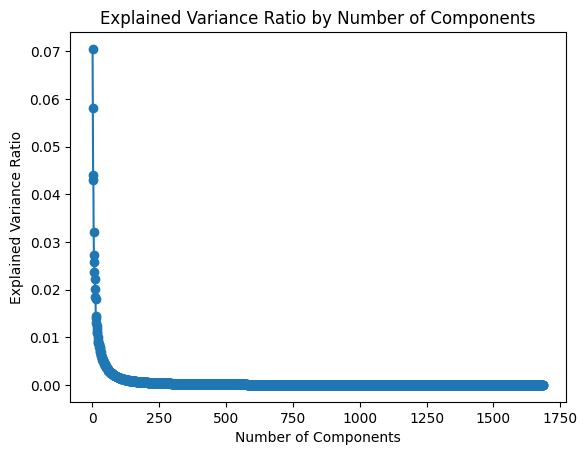

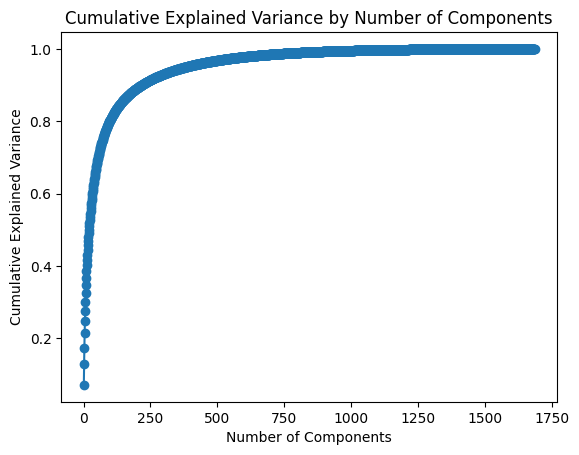

In [23]:
#load images from folder
def load_images_from_folder(folder):
    images = []
    filenames = []
    for filename in os.listdir(folder):
        if filename.endswith(('.jpg', '.jpeg', '.png')):
            img = Image.open(os.path.join(folder, filename))
            #img = img.convert('L') (depends if images are BW or RGB)
            images.append(img)
            filenames.append(filename)
    return images, filenames

#Resize to 64x64
def preprocess_images(images):
    resized_images = []
    for img in images:
        img = img.resize((64, 64))  # Resize images to a fixed size
        img = np.array(img)
        resized_images.append(img.flatten())
    return np.array(resized_images)

#plot similarity metrix
def plot_similarity_graph(similarity_matrix):
    plt.imshow(similarity_matrix, cmap='hot', interpolation='nearest') #using colormar hot
    plt.title('Image Similarity Graph')
    plt.colorbar() #add legend color
    plt.show()

#plot similar images    
def display_similar_images_diff_author(images, similarity_matrix, filenames, df, threshold=0.8):
    num_images = len(images)
    for i in range(num_images):
        for j in range(i+1, num_images): #so it doesn't plot duplicates two times
            if similarity_matrix[i, j] > threshold: #if close enough
                if filenames[i].split('_')[0]!=filenames[j].split('_')[0]: #if not from the same book
                    tmp0 = df.loc[df['folder_name']==filenames[i].split('-')[0]] #Display author + year
                    tmp1 = df.loc[df['folder_name']==filenames[j].split('-')[0]] #Display author + year
                    fig, axs = plt.subplots(1, 2, figsize=(8, 4)) #display two images in one plot
                    axs[0].imshow(images[i])
                    axs[0].set_title(tmp0['author'].item() + ' '+ str(tmp0['year'].item()))
                    axs[0].axis('off')
                    axs[1].imshow(images[j])
                    axs[1].set_title(tmp1['author'].item() + ' '+ str(tmp1['year'].item()))
                    axs[1].axis('off')
                    plt.show()

#generate a matrix of duplicates for across all books
def plot_matrix_cross_book(images, filenames, similarity_matrix, threshold = 0.7):
    author = []
    for i in range(len(filenames)): 
        if not filenames[i].split('_')[0] in author:
            author.append(filenames[i].split('_')[0])
    df = pd.DataFrame(0, index=author, columns=author)
    num_images = len(images)
    for i in range(num_images):
        for j in range(num_images):
            if similarity_matrix[i, j] > threshold:
                df.loc[filenames[i].split('_')[0], filenames[j].split('_')[0]]+=1
    return df

# Define the path to the image folder containing images we want to do a PCA on
image_folder = '/scratch/ndillenb/detected_image/'

# Load and preprocess the images
images, filenames = load_images_from_folder(image_folder)
X = preprocess_images(images)

# Perform PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
pca = PCA() #this will perform a PCA with all components (do not attempt if the dataset it too large)
components = pca.fit_transform(X_scaled)

# Calculate explained variance ratio and cumulative explained variance
explained_variance_ratio = pca.explained_variance_ratio_ #get y values 
cumulative_variance = np.cumsum(explained_variance_ratio) #sum y values

# Plot explained variance ratio
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio by Number of Components')
plt.show()

# Plot cumulative explained variance
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Number of Components')
plt.show()

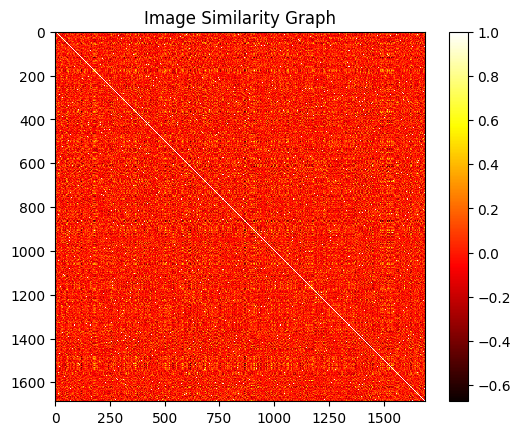

In [24]:
# Perform PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
pca = PCA(n_components=250)
components = pca.fit_transform(X_scaled)

# Calculate cosine similarity matrix
sim_matrix = cosine_similarity(components)

# Plot similarity graph
plot_similarity_graph(sim_matrix)

## Display similar images
This is memory expensive as a lot of images may be plotted

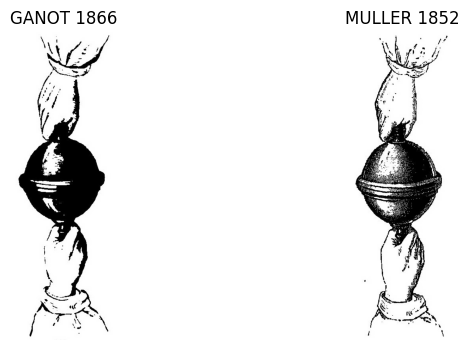

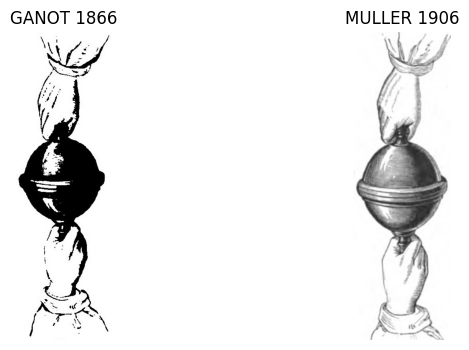

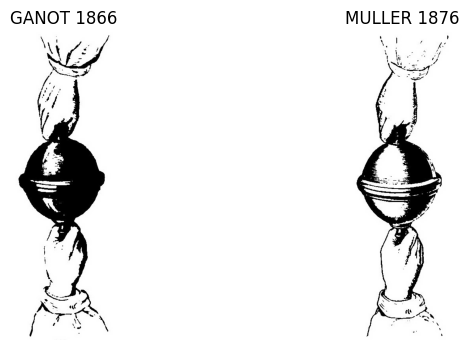

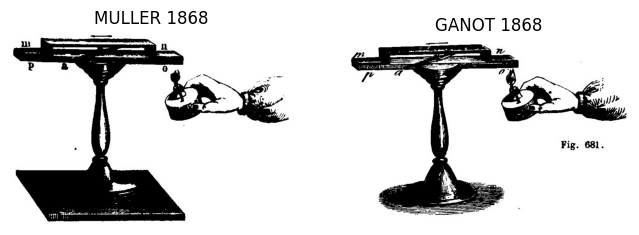

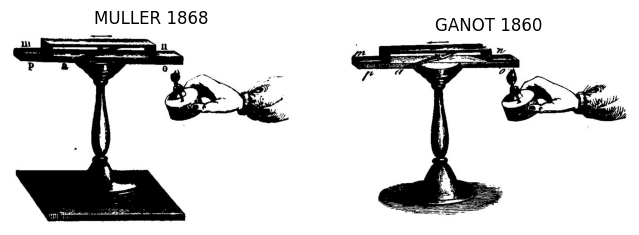

...

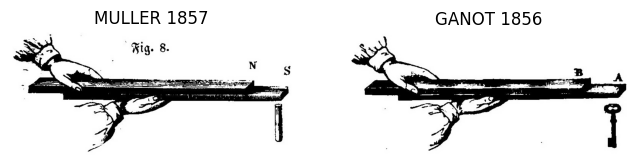

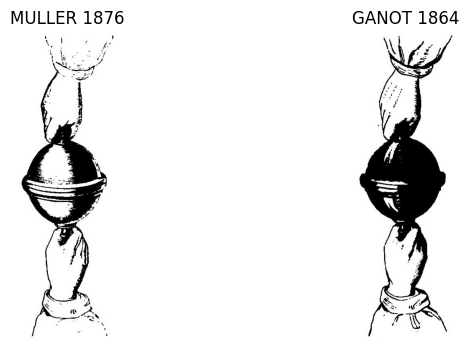

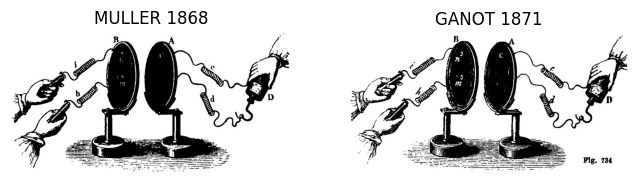

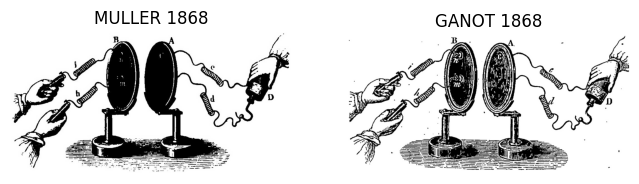

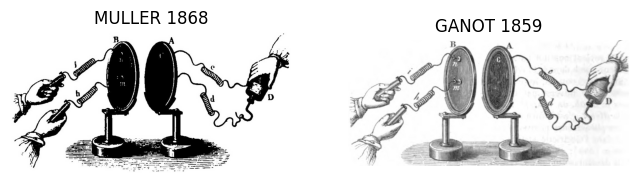

In [25]:
book_csv_file = '/scratch/ndillenb/book_csv_2.csv'
df = pd.read_csv(book_csv_file,encoding='utf-8',delimiter = ';',index_col=False,header=None,names = ['author','pdf_file','folder_name','book','pages','year','biblio','tome','edition'])
display_similar_images_diff_author(images, sim_matrix, filenames, df, threshold=0.7)

## Matrix of duplicates across books

In [26]:
df_matrix = plot_matrix_cross_book(images, filenames,sim_matrix, 0.7)
display(df_matrix)

,BRANLY,GANOT,BOUTAN,MULLER,FERNET,ANGOT,JAMIN,DAGUIN,POUILLET,VERDET,DESCHANEL,DESAINS,ROITI,BIRD,STEWART
BRANLY,108,1,0,0,2,0,0,0,0,0,0,0,0,0,0
GANOT,1,14475,0,181,0,0,0,0,1,0,1,0,11,0,0
BOUTAN,0,0,642,0,0,0,0,0,0,0,0,0,0,0,0
MULLER,0,181,0,273,0,0,0,0,0,0,0,0,0,0,0
FERNET,2,0,0,0,40,0,0,0,0,0,0,0,1,0,0
ANGOT,0,0,0,0,0,41,0,0,0,0,4,0,0,0,0
JAMIN,0,0,0,0,0,0,259,0,0,0,0,0,0,0,0
DAGUIN,0,0,0,0,0,0,0,30,0,0,0,0,0,0,0
POUILLET,0,1,0,0,0,0,0,0,2,0,1,0,0,0,0
VERDET,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
